In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/msrvtt/MSR-VTT/test_videodatainfo.json
/kaggle/input/msrvtt/MSR-VTT/combined_features.index
/kaggle/input/msrvtt/MSR-VTT/metadata.npy
/kaggle/input/msrvtt/MSR-VTT/category.txt
/kaggle/input/msrvtt/MSR-VTT/search_index.py
/kaggle/input/msrvtt/MSR-VTT/readme.txt
/kaggle/input/msrvtt/MSR-VTT/train_val_videodatainfo.json
/kaggle/input/msrvtt/MSR-VTT/Test.ipynb
/kaggle/input/msrvtt/MSR-VTT/preprocess_and_create_index.py
/kaggle/input/msrvtt/MSR-VTT/low-features/video7693.npy
/kaggle/input/msrvtt/MSR-VTT/low-features/video8155.npy
/kaggle/input/msrvtt/MSR-VTT/low-features/video8145.npy
/kaggle/input/msrvtt/MSR-VTT/low-features/video9904.npy
/kaggle/input/msrvtt/MSR-VTT/low-features/video8009.npy
/kaggle/input/msrvtt/MSR-VTT/low-features/video9322.npy
/kaggle/input/msrvtt/MSR-VTT/low-features/video8149.npy
/kaggle/input/msrvtt/MSR-VTT/low-features/video7448.npy
/kaggle/input/msrvtt/MSR-VTT/low-features/video8161.npy
/kaggle/input/msrvtt/MSR-VTT/low-features/video7324.npy
/kaggle

# STEP 1 : EDA

## Inspect one CLIP feature

In [2]:
import numpy as np
import os

clip_dir = "/kaggle/input/msrvtt/MSR-VTT/clip-features-vit-h14"

files = os.listdir(clip_dir)
print("Number of videos:", len(files))
print("Sample files:", files[:5])

feat = np.load(os.path.join(clip_dir, files[0]))
feat.shape


Number of videos: 2990
Sample files: ['video7693.npy', 'video8155.npy', 'video8145.npy', 'video9904.npy', 'video8009.npy']


(58, 1024)

## Load caption metadata (text side)

In [3]:
import json

json_path = "/kaggle/input/msrvtt/MSR-VTT/test_videodatainfo.json"

with open(json_path, "r") as f:
    data = json.load(f)

type(data)


dict

In [4]:
data.keys()


dict_keys(['info', 'videos', 'sentences'])

In [5]:
data["sentences"][:3]


[{'caption': 'a band performing in a small club',
  'video_id': 'video7960',
  'sen_id': 140200},
 {'caption': 'a band preforms a song',
  'video_id': 'video7960',
  'sen_id': 140201},
 {'caption': 'a clip showing a young man play the guitar and performing',
  'video_id': 'video7960',
  'sen_id': 140202}]

## Build a captions DataFrame

In [6]:
import pandas as pd

captions_df = pd.DataFrame(data["sentences"])
captions_df.head()


,caption,video_id,sen_id
0,a band performing in a small club,video7960,140200
1,a band preforms a song,video7960,140201
2,a clip showing a young man play the guitar and...,video7960,140202
3,a group of boys and girls are dancing,video7960,140203
4,a group of people kids dancing and playing music,video7960,140204


In [7]:
captions_df.info()
captions_df["caption"].apply(lambda x: len(x.split())).describe()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59800 entries, 0 to 59799
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   caption   59800 non-null  object
 1   video_id  59800 non-null  object
 2   sen_id    59800 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 1.4+ MB


count    59800.000000
mean         9.316137
std          4.245163
min          3.000000
25%          6.000000
50%          9.000000
75%         11.000000
max         59.000000
Name: caption, dtype: float64

<Axes: >

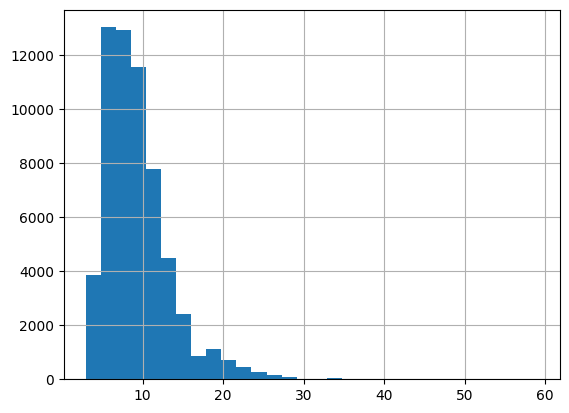

In [8]:
captions_df["caption"].apply(lambda x: len(x.split())).hist(bins=30)


In [9]:
# Load category file
cat_path = "/kaggle/input/msrvtt/MSR-VTT/category.txt"

with open(cat_path, "r") as f:
    categories = [line.strip() for line in f.readlines()]

print("Number of categories:", len(categories))
print("Sample categories:", categories[:10])


Number of categories: 20
Sample categories: ['music\t0', 'people\t1', 'gaming\t2', 'sports/actions\t3', 'news/events/politics\t4', 'education\t5', 'tv shows\t6', 'movie/comedy\t7', 'animation\t8', 'vehicles/autos\t9']


In [10]:
import pandas as pd

cat_path = "/kaggle/input/msrvtt/MSR-VTT/category.txt"

cat_map = pd.read_csv(
    cat_path,
    sep="\t",
    header=None,
    names=["category_name", "category_id"]
)

cat_map


,category_name,category_id
0,music,0
1,people,1
2,gaming,2
3,sports/actions,3
4,news/events/politics,4
5,education,5
6,tv shows,6
7,movie/comedy,7
8,animation,8
9,vehicles/autos,9


In [11]:
import pandas as pd

# Video-level metadata
videos_df = pd.DataFrame(data["videos"])
videos_df.head()


,category,url,video_id,start time,end time,split,id
0,10,https://www.youtube.com/watch?v=Sa4BUsvAcjc,video7010,401.51,419.65,test,7010
1,9,https://www.youtube.com/watch?v=2Poaq62Wrvk,video7011,426.17,439.49,test,7011
2,5,https://www.youtube.com/watch?v=wuhJ-GkRRQc,video7012,418.63,433.31,test,7012
3,5,https://www.youtube.com/watch?v=1B7b7VnG2t0,video7013,30.90,44.50,test,7013
4,14,https://www.youtube.com/watch?v=pQQ24JwtRUI,video7014,132.13,143.97,test,7014


In [12]:
cat_path = "/kaggle/input/msrvtt/MSR-VTT/category.txt"

cat_map = pd.read_csv(
    cat_path,
    sep="\t",
    header=None,
    names=["category_name", "category_id"]
)

cat_map.head()


,category_name,category_id
0,music,0
1,people,1
2,gaming,2
3,sports/actions,3
4,news/events/politics,4


In [13]:
video_cat_df = videos_df.merge(
    cat_map,
    left_on="category",
    right_on="category_id",
    how="left"
)

video_cat_df.head()


,category,url,video_id,start time,end time,split,id,category_name,category_id
0,10,https://www.youtube.com/watch?v=Sa4BUsvAcjc,video7010,401.51,419.65,test,7010,howto,10
1,9,https://www.youtube.com/watch?v=2Poaq62Wrvk,video7011,426.17,439.49,test,7011,vehicles/autos,9
2,5,https://www.youtube.com/watch?v=wuhJ-GkRRQc,video7012,418.63,433.31,test,7012,education,5
3,5,https://www.youtube.com/watch?v=1B7b7VnG2t0,video7013,30.90,44.50,test,7013,education,5
4,14,https://www.youtube.com/watch?v=pQQ24JwtRUI,video7014,132.13,143.97,test,7014,kids/family,14


In [14]:
test_video_cat_df = video_cat_df[video_cat_df["split"] == "test"]

print("Number of test videos:", len(test_video_cat_df))
test_video_cat_df.head()


Number of test videos: 2990


,category,url,video_id,start time,end time,split,id,category_name,category_id
0,10,https://www.youtube.com/watch?v=Sa4BUsvAcjc,video7010,401.51,419.65,test,7010,howto,10
1,9,https://www.youtube.com/watch?v=2Poaq62Wrvk,video7011,426.17,439.49,test,7011,vehicles/autos,9
2,5,https://www.youtube.com/watch?v=wuhJ-GkRRQc,video7012,418.63,433.31,test,7012,education,5
3,5,https://www.youtube.com/watch?v=1B7b7VnG2t0,video7013,30.90,44.50,test,7013,education,5
4,14,https://www.youtube.com/watch?v=pQQ24JwtRUI,video7014,132.13,143.97,test,7014,kids/family,14


In [15]:
category_counts_test = test_video_cat_df["category_name"].value_counts()
category_counts_test


category_name
sports/actions          324
movie/comedy            301
vehicles/autos          244
music                   226
food/drink              185
howto                   173
kids/family             171
animals/pets            170
gaming                  141
science/technology      139
news/events/politics    137
beauty/fashion          137
animation               122
cooking                 110
people                   79
tv shows                 77
travel                   75
education                74
advertisement            58
documentary              47
Name: count, dtype: int64

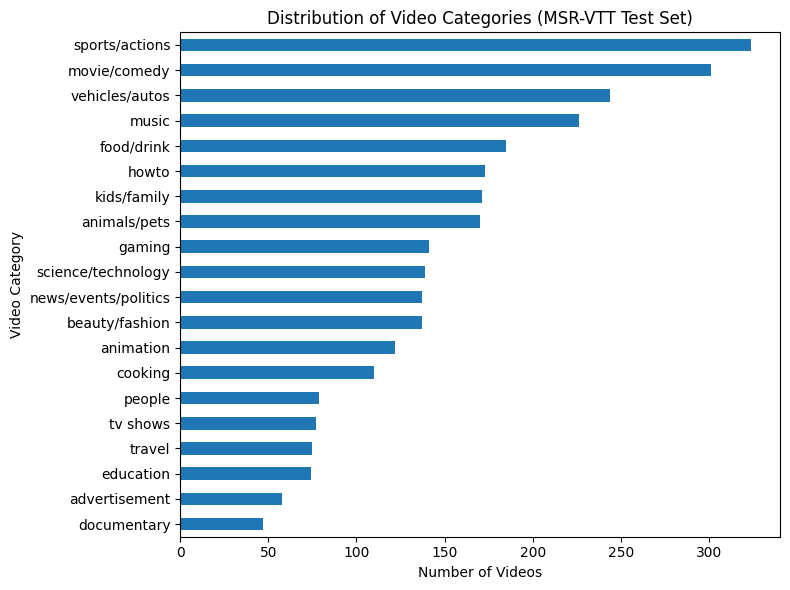

In [16]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
category_counts_test.sort_values().plot(kind="barh")
plt.xlabel("Number of Videos")
plt.ylabel("Video Category")
plt.title("Distribution of Video Categories (MSR-VTT Test Set)")
plt.tight_layout()

# Save for report / LaTeX
plt.savefig("/kaggle/working/video_category_distribution_test.png", dpi=300)
plt.show()


In [17]:
max_text_len = 59


## Captions per video

In [18]:
captions_df["video_id"].value_counts().describe()


count    2990.0
mean       20.0
std         0.0
min        20.0
25%        20.0
50%        20.0
75%        20.0
max        20.0
Name: count, dtype: float64

# STEP2 : CLIP Text Encoder

In [19]:
!pip -q install -U transformers accelerate

import os, json
import numpy as np
import pandas as pd
import torch
from tqdm import tqdm
from transformers import CLIPTokenizer, CLIPTextModel


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 72.2 MB/s eta 0:00:00:00:01:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.9/380.9 kB 23.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 553.2/553.2 kB 36.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentence-transformers 5.1.1 requires transformers<5.0.0,>=4.41.0, but you have transformers 5.0.0 which is incompatible.
gradio 5.49.1 requires pydantic<2.12,>=2.0, but you have pydantic 2.12.5 which is incompatible.


## LOAD CAPTIONS 

In [20]:
json_path = "/kaggle/input/msrvtt/MSR-VTT/test_videodatainfo.json"

with open(json_path, "r") as f:
    data = json.load(f)

captions_df = pd.DataFrame(data["sentences"])
print(captions_df.columns)
captions_df.head()


Index(['caption', 'video_id', 'sen_id'], dtype='object')


,caption,video_id,sen_id
0,a band performing in a small club,video7960,140200
1,a band preforms a song,video7960,140201
2,a clip showing a young man play the guitar and...,video7960,140202
3,a group of boys and girls are dancing,video7960,140203
4,a group of people kids dancing and playing music,video7960,140204


In [21]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

MODEL_NAME = "openai/clip-vit-base-patch32"

tokenizer = CLIPTokenizer.from_pretrained(MODEL_NAME)
text_model = CLIPTextModel.from_pretrained(MODEL_NAME).to(device)
text_model.eval()

@torch.no_grad()
def encode_texts(texts, batch_size=128, max_length=77, normalize=True):
    """
    Encode a list of strings into CLIP text embeddings.
    Returns: np.ndarray of shape [N, D]
    """
    all_embeds = []
    for i in tqdm(range(0, len(texts), batch_size), desc="Encoding text"):
        batch = texts[i:i+batch_size]
        inputs = tokenizer(
            batch,
            padding=True,
            truncation=True,
            max_length=max_length,
            return_tensors="pt"
        ).to(device)

        outputs = text_model(**inputs)

        # CLIPTextModel returns last_hidden_state: [B, T, D]
        # Standard pooling: take CLS token embedding at position 0
        embeds = outputs.last_hidden_state[:, 0, :]  # [B, D]

        if normalize:
            embeds = embeds / embeds.norm(dim=-1, keepdim=True)

        all_embeds.append(embeds.cpu().numpy())

    return np.vstack(all_embeds)

# Encode all captions
captions = captions_df["caption"].astype(str).tolist()
text_embeds = encode_texts(captions, batch_size=128)

print("Text embeddings shape:", text_embeds.shape)


Device: cuda


tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                                            | Status     |  | 
---------------------------------------------------------------+------------+--+-
vision_model.encoder.layers.{0...11}.layer_norm1.weight        | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.mlp.fc1.bias              | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.q_proj.weight   | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.layer_norm2.weight        | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.k_proj.bias     | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.v_proj.bias     | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.mlp.fc1.weight            | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.out_proj.bias   | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.v_proj.weight   | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.

Text embeddings shape: (59800, 512)


In [22]:
out_path = "/kaggle/working/text_embeds_clip_b32.npy"
np.save(out_path, text_embeds)
print("Saved to:", out_path)


Saved to: /kaggle/working/text_embeds_clip_b32.npy


In [23]:
clip_dir = "/kaggle/input/msrvtt/MSR-VTT/clip-features-vit-h14"
sample_vid = np.load(os.path.join(clip_dir, os.listdir(clip_dir)[0]))
print("Video embedding shape:", sample_vid.shape)
print("Text embedding shape:", text_embeds.shape[1:])


Video embedding shape: (58, 1024)
Text embedding shape: (512,)


In [24]:
!pip -q install -U open_clip_torch
import open_clip
import torch
import numpy as np
from tqdm import tqdm


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 25.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.0 MB/s eta 0:00:00


/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

In [25]:
device = "cuda" if torch.cuda.is_available() else "cpu"

# Try ViT-H-14 first (often 1024 dim). If not available in Kaggle image, fallback.
candidate_models = [
    ("ViT-H-14", "laion2b_s32b_b79k"),
    ("ViT-H-14", "laion2b_s34b_b79k"),
    ("ViT-g-14", "laion2b_s12b_b42k"),
    ("ViT-L-14", "openai"),
]

model = None
tokenizer = None
chosen = None

for arch, pretrained in candidate_models:
    try:
        m, _, _ = open_clip.create_model_and_transforms(arch, pretrained=pretrained, device=device)
        tok = open_clip.get_tokenizer(arch)
        # quick dim probe
        with torch.no_grad():
            t = tok(["dim probe"]).to(device)
            e = m.encode_text(t)
        print(f"Loaded {arch} ({pretrained}) -> text dim = {e.shape[-1]}")
        if e.shape[-1] == 1024:
            model, tokenizer, chosen = m, tok, (arch, pretrained)
            break
    except Exception as ex:
        print(f"Failed {arch} ({pretrained}): {type(ex).__name__}")

if model is None:
    raise RuntimeError("Could not load a 1024-d OpenCLIP text model. We'll use projection instead.")

model.eval()
print("Chosen:", chosen)


open_clip_model.safetensors:   0%|          | 0.00/3.94G [00:00<?, ?B/s]

Loaded ViT-H-14 (laion2b_s32b_b79k) -> text dim = 1024
Chosen: ('ViT-H-14', 'laion2b_s32b_b79k')


In [26]:
@torch.no_grad()
def encode_texts_openclip(texts, batch_size=256, normalize=True):
    all_embeds = []
    for i in tqdm(range(0, len(texts), batch_size), desc="Encoding text (OpenCLIP)"):
        batch = texts[i:i+batch_size]
        tokens = tokenizer(batch).to(device)
        embeds = model.encode_text(tokens)  # [B, D]

        if normalize:
            embeds = embeds / embeds.norm(dim=-1, keepdim=True)

        all_embeds.append(embeds.cpu().numpy())
    return np.vstack(all_embeds)

# captions_df already exists in your notebook
captions = captions_df["caption"].astype(str).tolist()
text_embeds_1024 = encode_texts_openclip(captions)

print("Text embeddings shape:", text_embeds_1024.shape)  # [num_captions, 1024]


Encoding text (OpenCLIP): 100%|██████████| 234/234 [15:35<00:00,  4.00s/it]

Text embeddings shape: (59800, 1024)


In [27]:
import os

clip_dir = "/kaggle/input/msrvtt/MSR-VTT/clip-features-vit-h14"

def load_video_embed(video_id):
    x = np.load(os.path.join(clip_dir, f"{video_id}.npy"))  # [58, 1024]
    v = x.mean(axis=0)  # [1024] mean-pool over 58 segments
    # normalize
    v = v / (np.linalg.norm(v) + 1e-12)
    return v.astype(np.float32)

# quick test
sample_file = os.listdir(clip_dir)[0]
sample_vid = sample_file.replace(".npy", "")
v = load_video_embed(sample_vid)
print("Pooled video vec shape:", v.shape)


Pooled video vec shape: (1024,)


## 1) Build pooled video embedding matrix (one vector per video)

In [28]:
import os, numpy as np
from tqdm import tqdm

clip_dir = "/kaggle/input/msrvtt/MSR-VTT/clip-features-vit-h14"

def pool_video_npy(path):
    x = np.load(path)          # [58, 1024]
    v = x.mean(axis=0)         # [1024]
    v = v / (np.linalg.norm(v) + 1e-12)
    return v.astype(np.float32)

video_files = sorted([f for f in os.listdir(clip_dir) if f.endswith(".npy")])
video_ids = [f.replace(".npy","") for f in video_files]

video_embeds = np.stack(
    [pool_video_npy(os.path.join(clip_dir, f)) for f in tqdm(video_files, desc="Loading video embeds")],
    axis=0
)  # [N_videos, 1024]

print("Videos:", len(video_ids), "video_embeds:", video_embeds.shape)


Loading video embeds: 100%|██████████| 2990/2990 [00:19<00:00, 151.57it/s]

Videos: 2990 video_embeds: (2990, 1024)


## 2) Prepare text embeddings + ground-truth mapping (caption → correct video)

In [29]:
# Map video_id -> index in video_embeds
vid2idx = {vid: i for i, vid in enumerate(video_ids)}

# Keep only captions whose video exists in clip features folder
mask = captions_df["video_id"].isin(vid2idx)
cap_df = captions_df[mask].reset_index(drop=True)

text_embeds = text_embeds_1024[mask.values]  # [N_caps, 1024]

gt = cap_df["video_id"].map(vid2idx).to_numpy()  # [N_caps]
print("Captions:", len(cap_df), "text_embeds:", text_embeds.shape, "gt:", gt.shape)


Captions: 59800 text_embeds: (59800, 1024) gt: (59800,)


In [30]:
print("Text dim:", text_embeds.shape[1], "Video dim:", video_embeds.shape[1])


Text dim: 1024 Video dim: 1024


## 3) Compute similarity and rank videos (cosine = dot product since normalized)

In [31]:
# cosine similarity (since both normalized)
S = text_embeds @ video_embeds.T  # [N_caps, N_vids]
print("Similarity matrix:", S.shape)


Similarity matrix: (59800, 2990)


## 4) Retrieval metrics: Recall@K, MedR, MeanR

In [32]:
def retrieval_metrics(sim_matrix, gt_video_indices, ks=(1,5,10)):
    """
    sim_matrix: [N_queries, N_videos]
    gt_video_indices: [N_queries] with correct video index per query
    """
    N = sim_matrix.shape[0]
    ranks = np.empty(N, dtype=np.int32)

    # rank of the correct video for each query
    for i in tqdm(range(N), desc="Ranking"):
        # argsort descending
        order = np.argsort(-sim_matrix[i])
        ranks[i] = int(np.where(order == gt_video_indices[i])[0][0]) + 1  # 1-based rank

    results = {}
    for k in ks:
        results[f"R@{k}"] = float(np.mean(ranks <= k))
    results["MedR"] = float(np.median(ranks))
    results["MeanR"] = float(np.mean(ranks))
    return results, ranks

metrics, ranks = retrieval_metrics(S, gt, ks=(1,5,10))
metrics


Ranking: 100%|██████████| 59800/59800 [00:03<00:00, 15774.48it/s]


{'R@1': 0.287943143812709,
 'R@5': 0.5059698996655518,
 'R@10': 0.5986956521739131,
 'MedR': 5.0,
 'MeanR': 79.23488294314382}

## 5) Show qualitative results (top-5 retrieved videos for a caption)

In [33]:
def show_topk(query_idx, k=5):
    caption = cap_df.loc[query_idx, "caption"]
    true_vid = cap_df.loc[query_idx, "video_id"]

    sims = S[query_idx]
    topk_idx = np.argsort(-sims)[:k]
    topk_vids = [video_ids[i] for i in topk_idx]

    print("Caption:", caption)
    print("GT video:", true_vid)
    print("Top-K:", topk_vids)
    print("GT rank:", ranks[query_idx])

show_topk(0, k=5)


Caption: a band performing in a small club
GT video: video7960
Top-K: ['video9665', 'video9601', 'video9895', 'video8466', 'video9988']
GT rank: 38


In [34]:
import json

out = {
    "metrics": metrics,
    "num_videos": int(video_embeds.shape[0]),
    "num_captions": int(text_embeds.shape[0]),
}
with open("/kaggle/working/retrieval_results.json", "w") as f:
    json.dump(out, f, indent=2)

print("Saved: /kaggle/working/retrieval_results.json")
print(metrics)


Saved: /kaggle/working/retrieval_results.json
{'R@1': 0.287943143812709, 'R@5': 0.5059698996655518, 'R@10': 0.5986956521739131, 'MedR': 5.0, 'MeanR': 79.23488294314382}


## Retrieval time

In [35]:
import time
t0 = time.time()
S = text_embeds @ video_embeds.T
_ = np.argsort(-S, axis=1)[:, :10]  # top-10
t1 = time.time()
print("Total retrieval time (all queries):", t1 - t0, "sec")
print("Avg time per query:", (t1 - t0)/S.shape[0], "sec")


Total retrieval time (all queries): 5.247886657714844 sec
Avg time per query: 8.775730196847565e-05 sec


## mAP (mean average precision) for 1 GT video per caption

In [36]:
mAP = float(np.mean(1.0 / ranks))
print("mAP:", mAP)


mAP: 0.39311000258885925


# STEP 3 : Visualizations 

## 1) Visualize Top-5 retrieved videos for a caption

In [37]:
def visualize_retrieval(query_idx, k=5):
    caption = cap_df.loc[query_idx, "caption"]
    true_vid = cap_df.loc[query_idx, "video_id"]

    sims = S[query_idx]
    topk_idx = np.argsort(-sims)[:k]
    topk_vids = [video_ids[i] for i in topk_idx]

    print("Text Query:")
    print(f"  \"{caption}\"")
    print("\nGround Truth Video:", true_vid)
    print("\nTop-K Retrieved Videos:")
    for rank, vid in enumerate(topk_vids, 1):
        mark = "✅" if vid == true_vid else ""
        print(f"  Rank {rank}: {vid} {mark}")

visualize_retrieval(query_idx=0, k=5)


Text Query:
  "a band performing in a small club"

Ground Truth Video: video7960

Top-K Retrieved Videos:
  Rank 1: video9665 
  Rank 2: video9601 
  Rank 3: video9895 
  Rank 4: video8466 
  Rank 5: video9988 


## 2) Metric Visualization (Bar Chart)

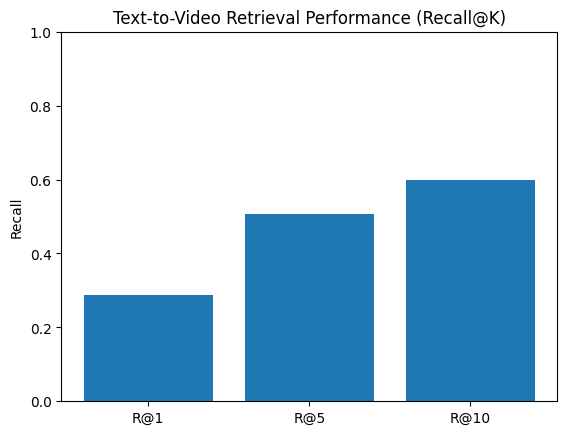

In [38]:
import matplotlib.pyplot as plt

recalls = {
    "R@1": metrics["R@1"],
    "R@5": metrics["R@5"],
    "R@10": metrics["R@10"]
}

plt.figure()
plt.bar(recalls.keys(), recalls.values())
plt.ylim(0, 1)
plt.ylabel("Recall")
plt.title("Text-to-Video Retrieval Performance (Recall@K)")
plt.show()


## 3) Rank Distribution Visualization

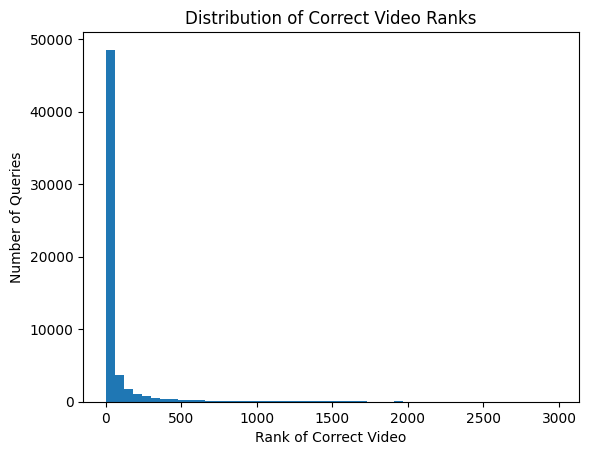

In [39]:
plt.figure()
plt.hist(ranks, bins=50)
plt.xlabel("Rank of Correct Video")
plt.ylabel("Number of Queries")
plt.title("Distribution of Correct Video Ranks")
plt.show()


## 4) Embedding Space Visualization (t-SNE)

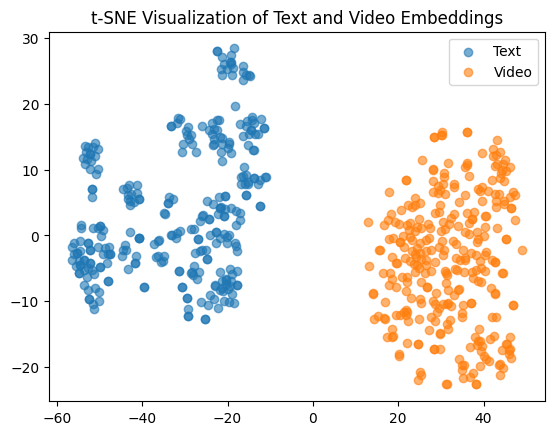

In [40]:
from sklearn.manifold import TSNE

# sample for speed
N = 300
text_sample = text_embeds[:N]
video_sample = video_embeds[:N]

X = np.vstack([text_sample, video_sample])
labels = ["Text"] * N + ["Video"] * N

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_2d = tsne.fit_transform(X)

plt.figure()
for lab in ["Text", "Video"]:
    idx = [i for i, l in enumerate(labels) if l == lab]
    plt.scatter(X_2d[idx,0], X_2d[idx,1], label=lab, alpha=0.6)

plt.legend()
plt.title("t-SNE Visualization of Text and Video Embeddings")
plt.show()


# check if video is retrieved using query 

In [41]:
video_root = "/kaggle/input/msrvtt/MSR-VTT/TrainValVideo"
os.listdir(video_root)[:5]


['video2438.mp4',
 'video797.mp4',
 'video3708.mp4',
 'video5598.mp4',
 'video1806.mp4']

In [42]:
from IPython.display import Video, display
import os

VIDEO_ROOT = "/kaggle/input/msrvtt/MSR-VTT"

def find_video_path(video_id):
    for split in ["TrainValVideo", "TestVideo"]:
        path = os.path.join(VIDEO_ROOT, split, f"{video_id}.mp4")
        if os.path.exists(path):
            return path
    return None


In [43]:
def show_video(video_id, width=400):
    path = find_video_path(video_id)
    if path is None:
        print(f"⚠️ Video file not available for {video_id}")
    else:
        display(Video(path, embed=True, width=width))


In [44]:
def visualize_video_retrieval(query_idx):
    caption = cap_df.loc[query_idx, "caption"]
    gt_vid = cap_df.loc[query_idx, "video_id"]

    sims = S[query_idx]
    top1_vid = video_ids[np.argmax(sims)]

    print("Text Query:")
    print(f"\"{caption}\"")

    print("\nGround Truth Video:")
    show_video(gt_vid)

    print("\nTop-1 Retrieved Video:")
    show_video(top1_vid)

visualize_video_retrieval(0)


Text Query:
"a band performing in a small club"

Ground Truth Video:



Top-1 Retrieved Video:


# STEP 4 : Fine Tuning

In [45]:
import torch
from torch.utils.data import Dataset, DataLoader

class CaptionVideoPairs(Dataset):
    def __init__(self, text_embeds_1024, gt_video_indices):
        self.text = torch.tensor(text_embeds_1024, dtype=torch.float32)
        self.gt = torch.tensor(gt_video_indices, dtype=torch.long)
    def __len__(self): return self.text.shape[0]
    def __getitem__(self, i):
        return self.text[i], self.gt[i]

train_ds = CaptionVideoPairs(text_embeds, gt)
train_loader = DataLoader(train_ds, batch_size=256, shuffle=True, num_workers=2, pin_memory=True)


## A — Prepare train pairs (caption → video index)

In [46]:
import torch.nn as nn
import torch.nn.functional as F

device = "cuda" if torch.cuda.is_available() else "cpu"

video_bank = torch.tensor(video_embeds, dtype=torch.float32, device=device)  # [N_vid, 1024]

class ProjectionRetrieval(nn.Module):
    def __init__(self, in_dim=1024, out_dim=512):
        super().__init__()
        self.text_proj = nn.Linear(in_dim, out_dim)
        self.vid_proj  = nn.Linear(in_dim, out_dim)
        self.logit_scale = nn.Parameter(torch.tensor(np.log(1/0.07), dtype=torch.float32))  # like CLIP temp

    def forward(self, text_1024, video_1024):
        t = F.normalize(self.text_proj(text_1024), dim=-1)
        v = F.normalize(self.vid_proj(video_1024), dim=-1)
        scale = self.logit_scale.exp().clamp(1, 100)
        return t, v, scale

model_ft = ProjectionRetrieval(1024, 512).to(device)
opt = torch.optim.AdamW(model_ft.parameters(), lr=1e-3, weight_decay=1e-4)


## B — Projection model + InfoNCE loss

In [47]:
def train_one_epoch(model, loader):
    model.train()
    total_loss = 0.0
    for text_batch, gt_vid_idx in loader:
        text_batch = text_batch.to(device, non_blocking=True)
        gt_vid_idx = gt_vid_idx.to(device, non_blocking=True)

        # Project text
        t, _, scale = model(text_batch, video_bank[:1])  # dummy video input
        # Project all videos once per batch
        v_all = F.normalize(model.vid_proj(video_bank), dim=-1)  # [N_vid, 512]

        # Similarities: [B, N_vid]
        logits = scale * (t @ v_all.T)

        loss = F.cross_entropy(logits, gt_vid_idx)

        opt.zero_grad()
        loss.backward()
        opt.step()

        total_loss += loss.item() * text_batch.size(0)

    return total_loss / len(loader.dataset)

for epoch in range(5):
    loss = train_one_epoch(model_ft, train_loader)
    print(f"Epoch {epoch+1}/5  loss={loss:.4f}")


Epoch 1/5  loss=3.6507
Epoch 2/5  loss=2.7296
Epoch 3/5  loss=2.4373
Epoch 4/5  loss=2.2458
Epoch 5/5  loss=2.1006


In [48]:
train_losses = []

for epoch in range(5):
    loss = train_one_epoch(model_ft, train_loader)
    train_losses.append(loss)
    print(f"Epoch {epoch+1}/5  loss={loss:.4f}")


Epoch 1/5  loss=1.9841
Epoch 2/5  loss=1.8825
Epoch 3/5  loss=1.7916
Epoch 4/5  loss=1.7033
Epoch 5/5  loss=1.6359


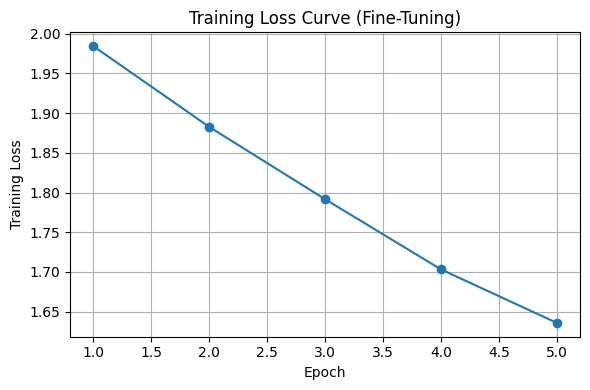

In [49]:
import matplotlib.pyplot as plt

epochs = range(1, len(train_losses) + 1)

plt.figure(figsize=(6,4))
plt.plot(epochs, train_losses, marker="o")
plt.xlabel("Epoch")
plt.ylabel("Training Loss")
plt.title("Training Loss Curve (Fine-Tuning)")
plt.grid(True)
plt.tight_layout()

# Save for report / LaTeX
plt.savefig("/kaggle/working/training_loss_curve.png", dpi=300)
plt.show()


## C — Training loop (in-batch negatives + full video bank)

In [50]:
model_ft.eval()
with torch.no_grad():
    t = torch.tensor(text_embeds, dtype=torch.float32, device=device)
    t = F.normalize(model_ft.text_proj(t), dim=-1).cpu().numpy()

    v = F.normalize(model_ft.vid_proj(video_bank), dim=-1).cpu().numpy()

S_ft = t @ v.T
metrics_ft, ranks_ft = retrieval_metrics(S_ft, gt, ks=(1,5,10))
metrics_ft


Ranking: 100%|██████████| 59800/59800 [00:03<00:00, 16025.49it/s]


{'R@1': 0.6615217391304348,
 'R@5': 0.8552173913043478,
 'R@10': 0.9032107023411371,
 'MedR': 1.0,
 'MeanR': 9.377909698996655}

In [51]:
import time

# Measure retrieval time
t_start = time.time()

S_ft = t @ v.T                     # similarity matrix
_ = np.argsort(-S_ft, axis=1)[:, :10]   # simulate Top-10 retrieval

t_end = time.time()

retrieval_time_total = t_end - t_start
retrieval_time_per_query = retrieval_time_total / S_ft.shape[0]


In [52]:
mAP_ft = float(np.mean(1.0 / ranks_ft))


In [53]:
metrics_ft["mAP"] = mAP_ft
metrics_ft["RetrievalTime_total_sec"] = retrieval_time_total
metrics_ft["RetrievalTime_per_query_sec"] = retrieval_time_per_query

metrics_ft


{'R@1': 0.6615217391304348,
 'R@5': 0.8552173913043478,
 'R@10': 0.9032107023411371,
 'MedR': 1.0,
 'MeanR': 9.377909698996655,
 'mAP': 0.7491539242570217,
 'RetrievalTime_total_sec': 4.3197736740112305,
 'RetrievalTime_per_query_sec': 7.223701796005402e-05}

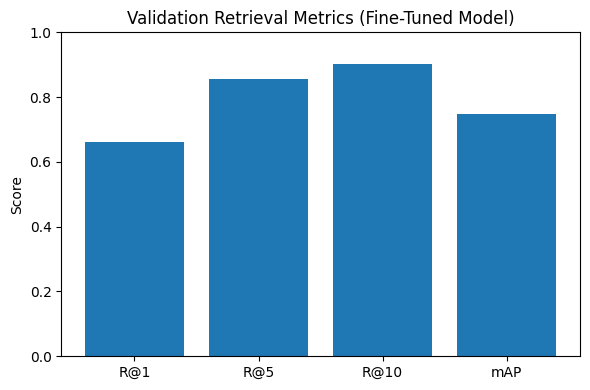

In [54]:
import matplotlib.pyplot as plt

# Extract validation metrics
val_metrics = {
    "R@1": metrics_ft["R@1"],
    "R@5": metrics_ft["R@5"],
    "R@10": metrics_ft["R@10"],
    "mAP": metrics_ft["mAP"]
}

plt.figure(figsize=(6,4))
plt.bar(val_metrics.keys(), val_metrics.values())
plt.ylim(0, 1)
plt.ylabel("Score")
plt.title("Validation Retrieval Metrics (Fine-Tuned Model)")
plt.tight_layout()

# Save figure
plt.savefig("/kaggle/working/validation_metrics_curve.png", dpi=300)
plt.show()


In [55]:
import os, numpy as np
from IPython.display import Video, display
from PIL import Image
import matplotlib.pyplot as plt

VIDEO_ROOT = "/kaggle/input/msrvtt/MSR-VTT"
KEYFRAMES_DIR = os.path.join(VIDEO_ROOT, "keyframes")

def find_video_path(video_id):
    for split in ["TrainValVideo", "TestVideo"]:
        p = os.path.join(VIDEO_ROOT, split, f"{video_id}.mp4")
        if os.path.exists(p):
            return p
    return None

def show_video_or_keyframes(video_id, n_frames=6, width=420):
    path = find_video_path(video_id)
    if path is not None:
        display(Video(path, embed=True, width=width))
        return

    # fallback: keyframes
    kdir = os.path.join(KEYFRAMES_DIR, video_id)
    if not os.path.isdir(kdir):
        print(f"⚠️ No video/keyframes for {video_id}")
        return

    frames = sorted([f for f in os.listdir(kdir) if f.lower().endswith((".jpg",".png"))])
    if not frames:
        print(f"⚠️ Empty keyframes for {video_id}")
        return

    idxs = np.linspace(0, len(frames)-1, min(n_frames, len(frames))).astype(int)
    chosen = [frames[i] for i in idxs]

    plt.figure(figsize=(12,3))
    for i,f in enumerate(chosen,1):
        img = Image.open(os.path.join(kdir,f))
        plt.subplot(1,len(chosen),i)
        plt.imshow(img); plt.axis("off")
    plt.suptitle(f"{video_id} (keyframes)", y=1.05)
    plt.show()


In [56]:
import random

def pick_r1_query(ranks_ft, seed=7):
    random.seed(seed)
    idxs = np.where(ranks_ft == 1)[0]
    if len(idxs) == 0:
        return None
    return int(random.choice(idxs))

q = pick_r1_query(ranks_ft)
print("Chosen query idx:", q)


Chosen query idx: 35804


In [57]:
def show_finetuned_r1(query_idx):
    caption = cap_df.loc[query_idx, "caption"]
    gt_vid  = cap_df.loc[query_idx, "video_id"]

    sims = S_ft[query_idx]
    top1_vid = video_ids[int(np.argmax(sims))]

    print("Text Query:")
    print(f"\"{caption}\"")
    print(f"\nGT video:  {gt_vid}")
    print(f"Top-1 (fine-tuned): {top1_vid}  ✅")
    print("-"*60)

    print("\nRetrieved Video (Top-1):")
    show_video_or_keyframes(top1_vid)

show_finetuned_r1(q)


Text Query:
"a house staircase is being shown"

GT video:  video7677
Top-1 (fine-tuned): video7677  ✅
------------------------------------------------------------

Retrieved Video (Top-1):


## 

/tmp/ipykernel_55/576187635.py:67: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_55/576187635.py:68: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig(out_path, dpi=300, bbox_inches="tight")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


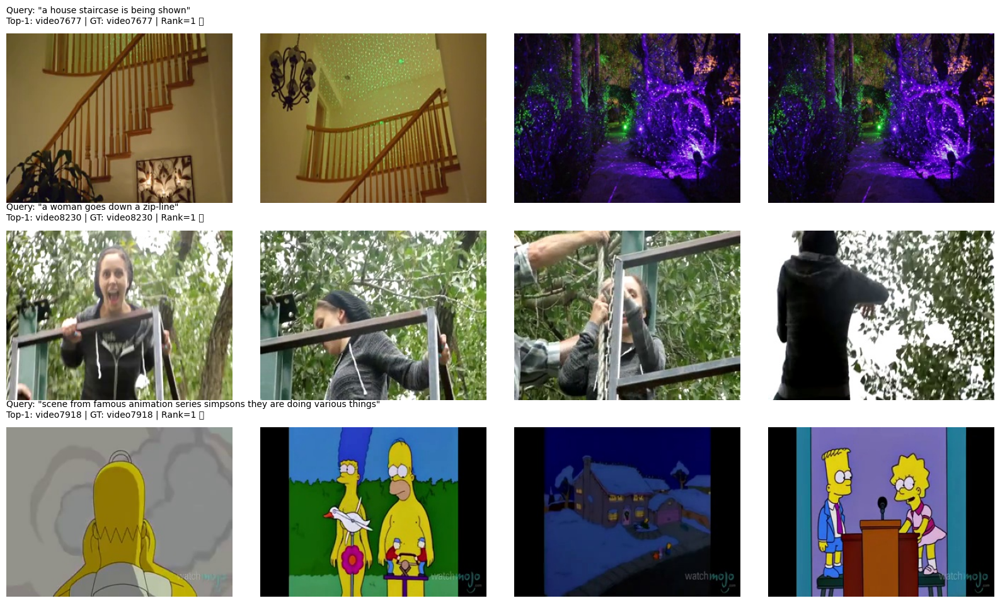

Saved: /kaggle/working/success_case_examples.png


In [68]:
import os, random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

KEYFRAMES_DIR = "/kaggle/input/msrvtt/MSR-VTT/keyframes"

def get_keyframes(video_id, n_frames=4):
    """Return a list of PIL images for evenly spaced keyframes."""
    folder = os.path.join(KEYFRAMES_DIR, video_id)
    if not os.path.isdir(folder):
        return []

    frames = sorted([f for f in os.listdir(folder) if f.lower().endswith((".jpg", ".png"))])
    if not frames:
        return []

    idxs = np.linspace(0, len(frames) - 1, min(n_frames, len(frames))).astype(int)
    imgs = []
    for i in idxs:
        imgs.append(Image.open(os.path.join(folder, frames[i])).convert("RGB"))
    return imgs

def make_success_case_figure(
    cap_df, ranks_ft, S_ft, video_ids,
    n_examples=3, frames_per_example=4,
    seed=7, out_path="/kaggle/working/success_case_examples.png"
):
    # Find R@1 successes (GT rank = 1)
    success_idxs = np.where(ranks_ft == 1)[0]
    if len(success_idxs) == 0:
        raise ValueError("No R@1 success cases found in ranks_ft.")

    random.seed(seed)
    chosen = random.sample(list(success_idxs), min(n_examples, len(success_idxs)))

    # Figure layout: rows = examples, cols = frames_per_example
    fig, axes = plt.subplots(len(chosen), frames_per_example, figsize=(4*frames_per_example, 3.2*len(chosen)))
    if len(chosen) == 1:
        axes = np.array([axes])  # make it 2D

    for r, qi in enumerate(chosen):
        query = str(cap_df.loc[qi, "caption"])
        gt_vid = str(cap_df.loc[qi, "video_id"])

        # Top-1 retrieved (fine-tuned)
        top1_vid = video_ids[int(np.argmax(S_ft[qi]))]

        imgs = get_keyframes(top1_vid, n_frames=frames_per_example)
        if len(imgs) == 0:
            # If keyframes missing, try GT keyframes instead
            imgs = get_keyframes(gt_vid, n_frames=frames_per_example)

        # Title per row (put above first subplot)
        row_title = f'Query: "{query}"\nTop-1: {top1_vid} | GT: {gt_vid} | Rank=1 ✅'
        axes[r, 0].set_title(row_title, loc="left", fontsize=10, pad=12)

        for c in range(frames_per_example):
            ax = axes[r, c]
            ax.axis("off")
            if c < len(imgs):
                ax.imshow(imgs[c])
            else:
                # empty cell
                ax.text(0.5, 0.5, "No frame", ha="center", va="center")

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()
    print("Saved:", out_path)

# Run it
make_success_case_figure(
    cap_df=cap_df,
    ranks_ft=ranks_ft,
    S_ft=S_ft,
    video_ids=video_ids,
    n_examples=3,            # change to 4 if you want
    frames_per_example=4,    # 4 frames per success case
    seed=7
)


# STEP 5 : Show before vs after (baseline vs fine-tuned) for the same query

In [59]:
import numpy as np
import random

def find_improving_query(ranks_base, ranks_ft, max_ft_rank=1, min_base_rank=2, seed=42):
    """
    Pick a query where baseline rank >= min_base_rank and fine-tuned rank <= max_ft_rank.
    Default: baseline not top-1, fine-tuned becomes top-1.
    """
    candidates = np.where((ranks_base >= min_base_rank) & (ranks_ft <= max_ft_rank))[0]
    if len(candidates) == 0:
        return None
    random.seed(seed)
    return int(random.choice(candidates))

q = find_improving_query(ranks, ranks_ft, max_ft_rank=1, min_base_rank=2, seed=7)
print("Chosen improving query idx:", q)
print("Baseline rank:", int(ranks[q]), "Fine-tuned rank:", int(ranks_ft[q]))


Chosen improving query idx: 28120
Baseline rank: 264 Fine-tuned rank: 1


In [60]:
def show_before_after(query_idx, show_gt_visual=False):
    caption = cap_df.loc[query_idx, "caption"]
    gt_vid  = cap_df.loc[query_idx, "video_id"]

    # Top-1 baseline
    top1_base = video_ids[int(np.argmax(S[query_idx]))]
    # Top-1 fine-tuned
    top1_ft   = video_ids[int(np.argmax(S_ft[query_idx]))]

    print("Text Query:")
    print(f"\"{caption}\"")
    print("-"*70)
    print(f"Ground Truth Video: {gt_vid}")
    print(f"Baseline:   Top-1={top1_base} | GT rank={int(ranks[query_idx])} {'✅' if top1_base==gt_vid else ''}")
    print(f"Fine-tuned: Top-1={top1_ft}   | GT rank={int(ranks_ft[query_idx])} {'✅' if top1_ft==gt_vid else ''}")
    print("-"*70)

    if show_gt_visual:
        print("\nGround Truth Visual:")
        show_video_or_keyframes(gt_vid)

    print("\nBEFORE (Baseline Top-1):")
    show_video_or_keyframes(top1_base)

    print("\nAFTER (Fine-tuned Top-1):")
    show_video_or_keyframes(top1_ft)

show_before_after(q, show_gt_visual=False)


Text Query:
"a clip from a movie from the movie channel"
----------------------------------------------------------------------
Ground Truth Video: video9811
Baseline:   Top-1=video7884 | GT rank=264 
Fine-tuned: Top-1=video9811   | GT rank=1 ✅
----------------------------------------------------------------------

BEFORE (Baseline Top-1):



AFTER (Fine-tuned Top-1):


In [61]:
def topk_list(sim_row, k=5):
    idx = np.argsort(-sim_row)[:k]
    return [video_ids[i] for i in idx]

print("Top-5 Baseline:", topk_list(S[q], k=5))
print("Top-5 Fine-tuned:", topk_list(S_ft[q], k=5))


Top-5 Baseline: ['video7884', 'video7539', 'video7241', 'video8075', 'video8117']
Top-5 Fine-tuned: ['video9811', 'video9369', 'video8829', 'video8850', 'video7881']


## Category-wise Recall@K (Baseline vs Fine-tuned)

Queries used: 59800


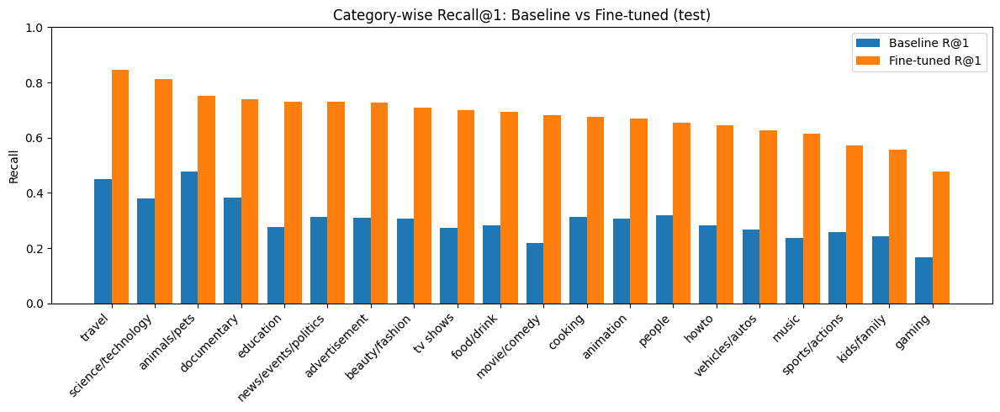

Saved: /kaggle/working/category_recall_comparison.png


In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =========================
# SETTINGS
# =========================
K = 1                  # change to 5 or 10 if needed
SPLIT_TO_PLOT = "test" # or None for all

# =========================
# 1) Build video_id -> category mapping
# =========================
videos_df = pd.DataFrame(data["videos"])

cat_map = pd.read_csv(
    "/kaggle/input/msrvtt/MSR-VTT/category.txt",
    sep="\t",
    header=None,
    names=["category_name", "category_id"]
)

video_cat_df = videos_df.merge(
    cat_map,
    left_on="category",
    right_on="category_id",
    how="left"
)[["video_id", "split", "category_name"]]

vid2cat = dict(zip(video_cat_df["video_id"], video_cat_df["category_name"]))
vid2split = dict(zip(video_cat_df["video_id"], video_cat_df["split"]))

# =========================
# 2) Attach category + split to each query (cap_df)
# =========================
tmp = cap_df.copy()
tmp["category"] = tmp["video_id"].map(vid2cat)
tmp["split"] = tmp["video_id"].map(vid2split)

# Keep only rows with valid category
mask_valid = tmp["category"].notna().values
tmp = tmp[mask_valid].reset_index(drop=True)

# Align ranks (THIS WAS THE BUG)
r_base = ranks[mask_valid]        # baseline ranks
r_ft   = ranks_ft[mask_valid]     # fine-tuned ranks

# Optional: filter by split
if SPLIT_TO_PLOT is not None:
    split_mask = (tmp["split"].values == SPLIT_TO_PLOT)
    tmp = tmp[split_mask].reset_index(drop=True)
    r_base = r_base[split_mask]
    r_ft   = r_ft[split_mask]

print("Queries used:", len(tmp))

# =========================
# 3) Category-wise Recall@K
# =========================
tmp["hit_base"] = (r_base <= K).astype(int)
tmp["hit_ft"]   = (r_ft   <= K).astype(int)

rec_base = tmp.groupby("category")["hit_base"].mean()
rec_ft   = tmp.groupby("category")["hit_ft"].mean()

# Align categories
cats = sorted(set(rec_base.index).union(set(rec_ft.index)))
rec_base = rec_base.reindex(cats).fillna(0.0)
rec_ft   = rec_ft.reindex(cats).fillna(0.0)

# Sort by fine-tuned recall
order = np.argsort(-rec_ft.values)
cats = [cats[i] for i in order]
rec_base = rec_base.values[order]
rec_ft   = rec_ft.values[order]

# =========================
# 4) Plot & Save
# =========================
x = np.arange(len(cats))
w = 0.4

plt.figure(figsize=(12,5))
plt.bar(x - w/2, rec_base, w, label=f"Baseline R@{K}")
plt.bar(x + w/2, rec_ft,   w, label=f"Fine-tuned R@{K}")

plt.xticks(x, cats, rotation=45, ha="right")
plt.ylim(0, 1)
plt.ylabel("Recall")
plt.title(f"Category-wise Recall@{K}: Baseline vs Fine-tuned ({SPLIT_TO_PLOT})")
plt.legend()
plt.tight_layout()

plt.savefig("/kaggle/working/category_recall_comparison.png", dpi=300)
plt.show()

print("Saved: /kaggle/working/category_recall_comparison.png")


## query length recall

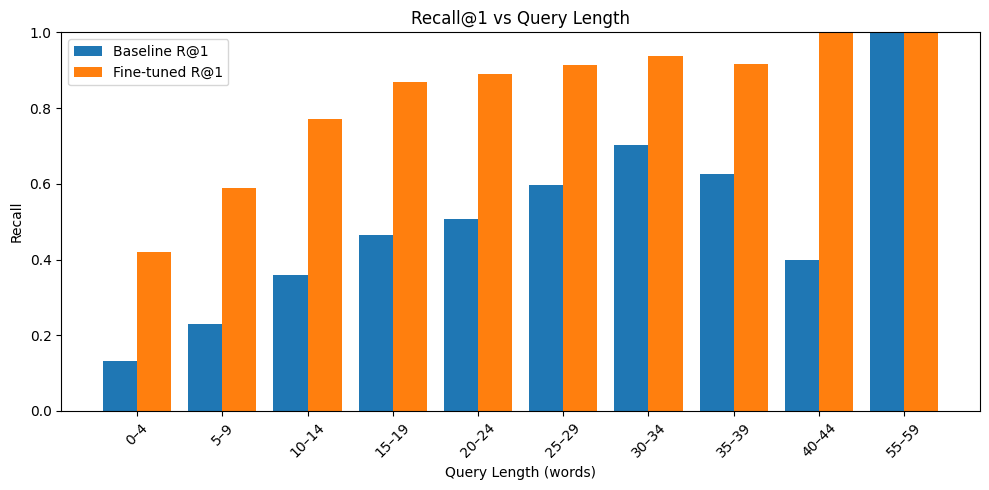

Saved: /kaggle/working/query_length_recall.png


In [63]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================
# SETTINGS
# =========================
K = 1                 # change to 5 or 10 if you want
BIN_SIZE = 5          # words per bin

# =========================
# 1) Compute query lengths
# =========================
qlen = cap_df["caption"].astype(str).apply(lambda x: len(x.split())).values

# =========================
# 2) Build analysis DataFrame
# =========================
df_len = pd.DataFrame({
    "query_length": qlen,
    "hit_base": (ranks <= K).astype(int),
    "hit_ft": (ranks_ft <= K).astype(int)
})

# =========================
# 3) Create length bins
# =========================
max_len = df_len["query_length"].max()
bins = np.arange(0, max_len + BIN_SIZE, BIN_SIZE)

df_len["length_bin"] = pd.cut(
    df_len["query_length"],
    bins=bins,
    right=False
)

# =========================
# 4) Compute Recall@K per bin
# =========================
recall_by_len = df_len.groupby("length_bin", observed=True).mean()


# Clean labels for plotting
labels = [f"{int(b.left)}–{int(b.right)-1}" for b in recall_by_len.index]

# =========================
# 5) Plot & Save
# =========================
x = np.arange(len(labels))
w = 0.4

plt.figure(figsize=(10,5))
plt.bar(x - w/2, recall_by_len["hit_base"], w, label=f"Baseline R@{K}")
plt.bar(x + w/2, recall_by_len["hit_ft"],   w, label=f"Fine-tuned R@{K}")

plt.xticks(x, labels, rotation=45)
plt.xlabel("Query Length (words)")
plt.ylabel("Recall")
plt.ylim(0, 1)
plt.title(f"Recall@{K} vs Query Length")
plt.legend()
plt.tight_layout()

plt.savefig("/kaggle/working/query_length_recall.png", dpi=300)
plt.show()

print("Saved: /kaggle/working/query_length_recall.png")


## Baseline Similarity Distribution

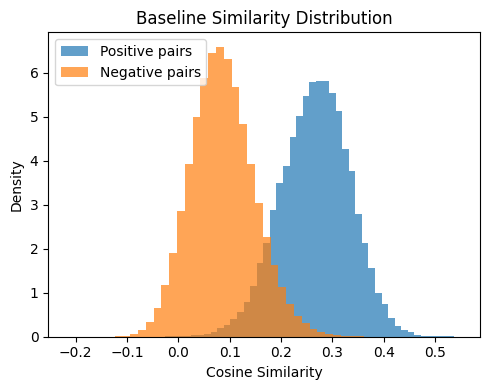

In [71]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------
# Baseline similarities
# -------------------------
pos_sims_base = []
neg_sims_base = []

for i in range(S.shape[0]):
    pos_sims_base.append(S[i, gt[i]])
    neg_sims_base.extend(np.delete(S[i], gt[i]))

pos_sims_base = np.array(pos_sims_base)
neg_sims_base = np.array(neg_sims_base)

# Plot
plt.figure(figsize=(5,4))
plt.hist(pos_sims_base, bins=50, alpha=0.7, label="Positive pairs", density=True)
plt.hist(neg_sims_base, bins=50, alpha=0.7, label="Negative pairs", density=True)
plt.xlabel("Cosine Similarity")
plt.ylabel("Density")
plt.title("Baseline Similarity Distribution")
plt.legend()
plt.tight_layout()

plt.savefig("/kaggle/working/baseline_similarity_distribution.png", dpi=300)
plt.show()


## Fine-Tuned Similarity Distribution

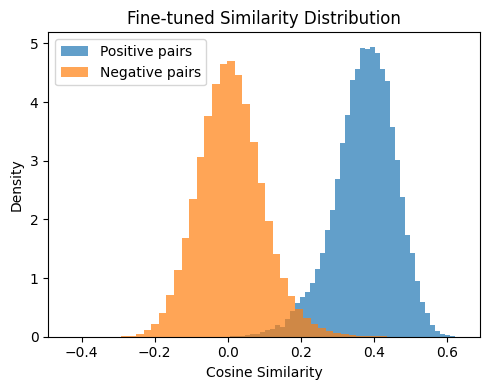

In [72]:
# -------------------------
# Fine-tuned similarities
# -------------------------
pos_sims_ft = []
neg_sims_ft = []

for i in range(S_ft.shape[0]):
    pos_sims_ft.append(S_ft[i, gt[i]])
    neg_sims_ft.extend(np.delete(S_ft[i], gt[i]))

pos_sims_ft = np.array(pos_sims_ft)
neg_sims_ft = np.array(neg_sims_ft)

# Plot
plt.figure(figsize=(5,4))
plt.hist(pos_sims_ft, bins=50, alpha=0.7, label="Positive pairs", density=True)
plt.hist(neg_sims_ft, bins=50, alpha=0.7, label="Negative pairs", density=True)
plt.xlabel("Cosine Similarity")
plt.ylabel("Density")
plt.title("Fine-tuned Similarity Distribution")
plt.legend()
plt.tight_layout()

plt.savefig("/kaggle/working/finetuned_similarity_distribution.png", dpi=300)
plt.show()


## Success-case qualitative comparison (Baseline vs Fine-tuned)

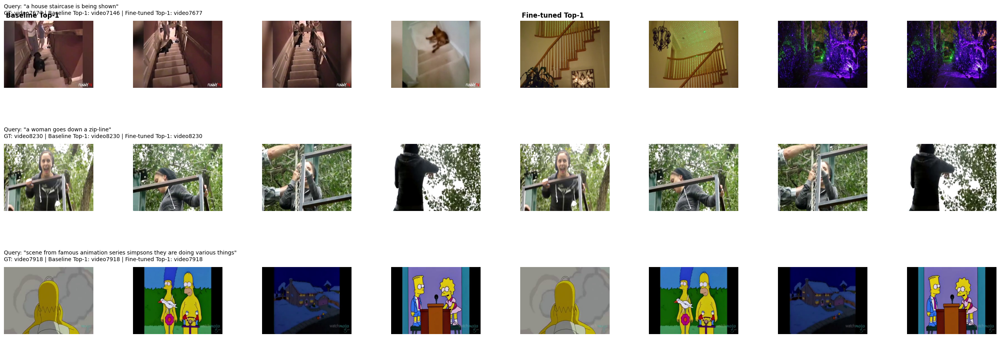

Saved: /kaggle/working/success_case_examples.png


In [73]:
import os, random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

KEYFRAMES_DIR = "/kaggle/input/msrvtt/MSR-VTT/keyframes"

def get_keyframes(video_id, n_frames=4):
    folder = os.path.join(KEYFRAMES_DIR, video_id)
    if not os.path.isdir(folder):
        return []

    frames = sorted([f for f in os.listdir(folder) if f.lower().endswith((".jpg", ".png"))])
    if not frames:
        return []

    idxs = np.linspace(0, len(frames) - 1, min(n_frames, len(frames))).astype(int)
    imgs = []
    for i in idxs:
        imgs.append(Image.open(os.path.join(folder, frames[i])).convert("RGB"))
    return imgs

def make_success_cases_before_after(
    cap_df, ranks_ft, S_base, S_ft, video_ids,
    n_examples=3, frames_each=4, seed=7,
    out_path="/kaggle/working/success_case_examples.png"
):
    # pick success cases where fine-tuned GT rank == 1
    success_idxs = np.where(ranks_ft == 1)[0]
    if len(success_idxs) == 0:
        raise ValueError("No fine-tuned R@1 success cases found (ranks_ft == 1).")

    random.seed(seed)
    chosen = random.sample(list(success_idxs), min(n_examples, len(success_idxs)))

    n_cols = frames_each * 2  # left baseline frames, right fine-tuned frames
    fig, axes = plt.subplots(len(chosen), n_cols, figsize=(3.2*n_cols, 3.3*len(chosen)))

    if len(chosen) == 1:
        axes = np.array([axes])  # make 2D

    for r, qi in enumerate(chosen):
        query = str(cap_df.loc[qi, "caption"])
        gt_vid = str(cap_df.loc[qi, "video_id"])

        top1_base = video_ids[int(np.argmax(S_base[qi]))]
        top1_ft   = video_ids[int(np.argmax(S_ft[qi]))]

        # Pull keyframes (fallback to GT if keyframes missing)
        base_imgs = get_keyframes(top1_base, n_frames=frames_each) or get_keyframes(gt_vid, n_frames=frames_each)
        ft_imgs   = get_keyframes(top1_ft,   n_frames=frames_each) or get_keyframes(gt_vid, n_frames=frames_each)

        # Row title (above first axis)
        title = (
            f'Query: "{query}"\n'
            f'GT: {gt_vid} | Baseline Top-1: {top1_base} | Fine-tuned Top-1: {top1_ft}'
        )
        axes[r, 0].set_title(title, loc="left", fontsize=10, pad=12)

        # Baseline frames (left)
        for c in range(frames_each):
            ax = axes[r, c]
            ax.axis("off")
            if c < len(base_imgs):
                ax.imshow(base_imgs[c])
            else:
                ax.text(0.5, 0.5, "No frame", ha="center", va="center")

            # Put "Baseline" label once
            if r == 0 and c == 0:
                ax.text(0.02, 1.05, "Baseline Top-1", transform=ax.transAxes, fontsize=12, weight="bold")

        # Fine-tuned frames (right)
        for c in range(frames_each):
            ax = axes[r, frames_each + c]
            ax.axis("off")
            if c < len(ft_imgs):
                ax.imshow(ft_imgs[c])
            else:
                ax.text(0.5, 0.5, "No frame", ha="center", va="center")

            # Put "Fine-tuned" label once
            if r == 0 and c == 0:
                ax.text(0.02, 1.05, "Fine-tuned Top-1", transform=ax.transAxes, fontsize=12, weight="bold")

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()
    print("Saved:", out_path)

# RUN (uses your variables)
make_success_cases_before_after(
    cap_df=cap_df,
    ranks_ft=ranks_ft,
    S_base=S,        # baseline similarity matrix
    S_ft=S_ft,       # fine-tuned similarity matrix
    video_ids=video_ids,
    n_examples=3,    # set 4 if you want more rows
    frames_each=4,
    seed=7
)


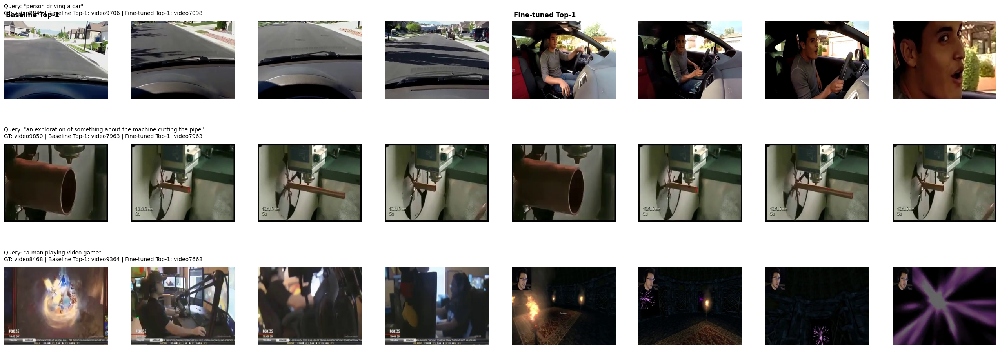

Saved: /kaggle/working/failure_case_examples.png


In [74]:
import os, random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

KEYFRAMES_DIR = "/kaggle/input/msrvtt/MSR-VTT/keyframes"

def get_keyframes(video_id, n_frames=4):
    folder = os.path.join(KEYFRAMES_DIR, video_id)
    if not os.path.isdir(folder):
        return []

    frames = sorted([f for f in os.listdir(folder) if f.lower().endswith((".jpg", ".png"))])
    if not frames:
        return []

    idxs = np.linspace(0, len(frames) - 1, min(n_frames, len(frames))).astype(int)
    return [Image.open(os.path.join(folder, frames[i])).convert("RGB") for i in idxs]

def make_failure_cases_before_after(
    cap_df, ranks_ft, S_base, S_ft, video_ids,
    n_examples=3, frames_each=4, seed=9,
    out_path="/kaggle/working/failure_case_examples.png"
):
    # Failure = fine-tuned rank > 1
    fail_idxs = np.where(ranks_ft > 1)[0]
    if len(fail_idxs) == 0:
        raise ValueError("No failure cases found (ranks_ft > 1).")

    random.seed(seed)
    chosen = random.sample(list(fail_idxs), min(n_examples, len(fail_idxs)))

    n_cols = frames_each * 2
    fig, axes = plt.subplots(len(chosen), n_cols, figsize=(3.2*n_cols, 3.3*len(chosen)))
    if len(chosen) == 1:
        axes = np.array([axes])

    for r, qi in enumerate(chosen):
        query = str(cap_df.loc[qi, "caption"])
        gt_vid = str(cap_df.loc[qi, "video_id"])

        top1_base = video_ids[int(np.argmax(S_base[qi]))]
        top1_ft   = video_ids[int(np.argmax(S_ft[qi]))]

        base_imgs = get_keyframes(top1_base, frames_each) or get_keyframes(gt_vid, frames_each)
        ft_imgs   = get_keyframes(top1_ft,   frames_each) or get_keyframes(gt_vid, frames_each)

        title = (
            f'Query: "{query}"\n'
            f'GT: {gt_vid} | Baseline Top-1: {top1_base} | Fine-tuned Top-1: {top1_ft}'
        )
        axes[r, 0].set_title(title, loc="left", fontsize=10, pad=12)

        # Baseline (left)
        for c in range(frames_each):
            ax = axes[r, c]
            ax.axis("off")
            if c < len(base_imgs):
                ax.imshow(base_imgs[c])
            if r == 0 and c == 0:
                ax.text(0.02, 1.05, "Baseline Top-1", transform=ax.transAxes,
                        fontsize=12, weight="bold")

        # Fine-tuned (right)
        for c in range(frames_each):
            ax = axes[r, frames_each + c]
            ax.axis("off")
            if c < len(ft_imgs):
                ax.imshow(ft_imgs[c])
            if r == 0 and c == 0:
                ax.text(0.02, 1.05, "Fine-tuned Top-1", transform=ax.transAxes,
                        fontsize=12, weight="bold")

    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()
    print("Saved:", out_path)

# RUN
make_failure_cases_before_after(
    cap_df=cap_df,
    ranks_ft=ranks_ft,
    S_base=S,
    S_ft=S_ft,
    video_ids=video_ids,
    n_examples=3,
    frames_each=4
)
